# Lukas Kanade Optical Flow Algorithm

In [1]:
import os
import sys
import numpy as np
import scipy
import matplotlib.pyplot as plt
import cv2
import glob
from scipy.signal import convolve2d
import warnings
warnings.filterwarnings("ignore")

### Key assumptions of Lucas Kanade Tracker 
1. Brightness Constancy: 
    * projection of the same point looks the same every frame
2. Small Motion:
    * points do not move very far
3. Spatial Coherence:
    * points move like their neighbors

## Brightness Constancy Equation:
$$I(x, y, t) = I(x + u, y + v, t + 1)$$

taking taylor expansion of rhs and simplifying we get,

$$I_x.u + I_y.v + I_t = 0$$

but here we get only one equation but two unknowns (flow vector)

We get more equations for a pixel by using the **spacial coherence constraint**
- Assume the pixel's neighbors have the same (u, v)
    - If we use a 5x5 window, thata gives us 25 equations per pixel!
- Now we have more equations than unknowns
$$ A d = b --> minimize || Ad - b|| ^ 2$$
$$ A^TA d = A^Tb $$
- Solution: solve least squares problem

In [2]:
def computeDerivatives(im1, im2):
    grad = {
        'x': np.zeros(im1.shape),
        'y': np.zeros(im1.shape),
        't': np.zeros(im1.shape),
    }
    
    Gx = np.array([[-1, 1], [-1, 1]])  # for image 1 and image 2 in x direction
    Gy = np.array([[-1, -1], [1, 1]])  # for image 1 and image 2 in y direction
    Gt1 = np.array([[-1, -1], [-1, -1]])  # for 1st image
    Gt2 = np.array([[1, 1], [1, 1]])  # for 2nd image

    grad['x'] = (convolve2d(im1, Gx, mode='same') + convolve2d(im2, Gx, mode='same')) / 2 #smoothing in x direction
    grad['y'] = (convolve2d(im1, Gy, mode='same') + convolve2d(im2, Gy, mode='same')) / 2 #smoothing in y direction
    grad['t'] = convolve2d(im1, Gt1, mode='same') + convolve2d(im2, Gt2, mode='same')   #taking difference of two images using gaussian mask of all -1 and all 1    
    return grad

In [109]:
def lucas_kanade(im1, im2, win=11):
    
    ## calculating spacial and temporal gradients
    grad = computeDerivatives(im1, im2)    
    
    ## calculating AT . A and AT b here
    ## using gaussian blur to give more stability
    
    params = np.zeros(im1.shape + (5,))
    operations = [grad['x'] * grad['x'],grad['y'] * grad['y'],grad['x'] * grad['y']
                 ,grad['x'] * grad['t'],grad['y'] * grad['t']]

    for i,op in enumerate(operations):
        params[:,:,i] = cv2.GaussianBlur(op,(win,win),3)

    cum_params = np.cumsum(np.cumsum(params, axis=0), axis=1)
    
    win_params = (cum_params[2 * win + 1:, 2 * win + 1:] -
                  cum_params[2 * win + 1:, :-1 - 2 * win] -
                  cum_params[:-1 - 2 * win, 2 * win + 1:] +
                  cum_params[:-1 - 2 * win, :-1 - 2 * win])

    u = np.zeros(im1.shape)
    v = np.zeros(im1.shape)

    dgrad = {
        'xx' : win_params[:,:, 0],
        'yy' : win_params[:,:, 1],
        'xy' : win_params[:,:, 2],
        'xt' : -win_params[:,:, 3],
        'yt' : -win_params[:,:, 4],
    }
    
    
    ## det of AT A
    M_det = (dgrad['xx'] * dgrad['yy']) - np.power(dgrad['xy'], 2)
    
    ## giving out the flows according to the equation
    temp_u = dgrad['yy'] * (-dgrad['xt']) + (-dgrad['xy']) * (-dgrad['yt'])
    temp_v = (-dgrad['xy']) * (-dgrad['xt']) + dgrad['xx'] * (-dgrad['yt'])

    op_flow_x = np.where(M_det != 0, temp_u / M_det, 0)
    op_flow_y = np.where(M_det != 0, temp_v / M_det, 0)

    u[win + 1: -1 - win, win + 1: -1 - win] = op_flow_x[:-1, :-1]
    v[win + 1: -1 - win, win + 1: -1 - win] = op_flow_y[:-1, :-1]

    return np.dstack((u, v))

In [113]:
def draw_hsv(flow, mask=None):
    h, w = flow.shape[:2]
    fx, fy = flow[:, :, 0], flow[:, :, 1]
    hsv = np.zeros((h, w, 3))
    mag, ang = cv2.cartToPolar(fx, fy)
    mean, std = mag.mean(), mag.std()
    hsv[:,:, 0] = ang*180/np.pi/2
    hsv[:,:, 1] = 255
#     hsv[..., 2] = cv2.normalize(mag, None, 0, 255, cv2.NORM_MINMAX)
    hsv[:,:, 2] = 255*np.clip((mag - mean)/std, 0, 1)
    if mask is not None:
        hsv[:,:, 2] = hsv[:,:, 2] * mask
    hsv = hsv.astype('uint8')
    rgb = cv2.cvtColor(hsv, cv2.COLOR_HSV2BGR)
    return rgb

In [133]:
def optflow_vid(path, outpath, mode='vid', gran=10, magnify=5, win=11):
    count = 0
    
    vidObj = cv2.VideoCapture(path)
    fps = vidObj.get(cv2.CAP_PROP_FPS)
    success, image = vidObj.read()
    previmage = image

    size = (image.shape[1], image.shape[0])
    codec = cv2.VideoWriter_fourcc(*'DIVX')

    out = cv2.VideoWriter(outpath, codec, fps, size)
    hout = cv2.VideoWriter('hsv'+outpath, codec, fps, size)
    bout = cv2.VideoWriter('bbox'+outpath, codec, fps, size)

    while success:
        count += 1
        print('processing frame', count, end='\r')
        success, curimage = vidObj.read()
        if not success:
            break
        flow = lucas_kanade(cv2.cvtColor(previmage, cv2.COLOR_BGR2GRAY), cv2.cvtColor(curimage, cv2.COLOR_BGR2GRAY), win=win)
        fmap = compute_flow_map(previmage, flow, gran=gran, magnify=magnify)
        mask = get_flow_mask(previmage, flow, magnify=magnify)
        hmap = draw_hsv(flow, mask)            
        bmap = get_bbox(previmage, mask)
        if count % 100 == 0:
            _, plts = plt.subplots(3,1,figsize=(20,20))
            plts[0].imshow(fmap)
            plts[1].imshow(hmap)
            plts[2].imshow(bmap)
            plt.show()
        out.write(fmap)
        hout.write(hmap)
        bout.write(bmap)
        previmage = curimage

    out.release()
    print('out made')
    hout.release()
    print('hout made')
    bout.release()
    print('bout made')
        
        
    
        
    print('processes', count, 'frames')
        

In [115]:
def compute_flow_map(image, flow, gran=8, magnify=10):
    flow_map = image.copy()
    fx, fy = flow[:, :, 0], flow[:, :, 1]
    for y in range(0, flow_map.shape[0], gran):
        for x in range(0, flow_map.shape[1], gran):
            dx = magnify*int(fx[y, x])
            dy = magnify*int(fy[y, x])
            try:
                cv2.arrowedLine(flow_map, (x, y), (x + dx, y + dy), (0, 255, 255), 1, 4, 0, 0.2)
            except:
                pass
    return flow_map

In [116]:
def get_flow_mask(image, flow, magnify=10):
    flow_mask = np.zeros((image.shape[0], image.shape[1]))
    fx, fy = flow[:, :, 0], flow[:, :, 1]
    flow_mask = np.where((abs(fx)+abs(fy))>1, 1, 0)
    return np.uint8(flow_mask)

In [117]:
def get_bbox(image, mask):
    res = image.copy()
    _, contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    i = 0
    for cnt in contours:
        x, y, w, h = cv2.boundingRect(cnt)
        cv2.rectangle(res, (x, y), (x+w, y+h), (0, 255, 0), 2)
        i += 1        
    return res

## Moving camera

- When the camera is moving, it poses a very difficult situation as what we are estimating through Lucas Kanade is the optical field of the scene. When the camera moves the object seems to move in the opposite direction. In this situation the naive implementation will give optical flow vectors all over the image, we can try to minimize this effect by using only the keypoints and measure their flow vectors.

## Results on some samples

- Some thresholding has been done to get good results

In [120]:
def plot_results(path1, path2):
    im1 = cv2.imread(path1,0)
    im2 = cv2.imread(path2,0)

    flow = lucas_kanade(im1, im2)
    flow_mask = get_flow_mask(im1, flow, magnify=2)
    
    flow_map = compute_flow_map(im1, flow, gran=8, magnify=3)
    hsv_map = draw_hsv(flow, flow_mask)
    bbox_map = get_bbox(im1, flow_mask)
        
    _, plts = plt.subplots(2, 2, figsize=(20,20))
    plts[0][0].imshow(im1,cmap='gray')
    plts[0][0].set_title('image 1')
    plts[0][1].imshow(im2,cmap='gray')
    plts[0][1].set_title('image 2')
    plts[1][0].imshow(flow_map,cmap='gray')
    plts[1][0].set_title('flow map (flow-directions)')
    plts[1][1].imshow(hsv_map)
    plts[1][1].set_title('hsv map (segs depending on angle and mag)')
    plt.show()
    
#     return flow_map, hsv_map, bbox_map
    
    

In [121]:
root = 'eval-data-gray/'

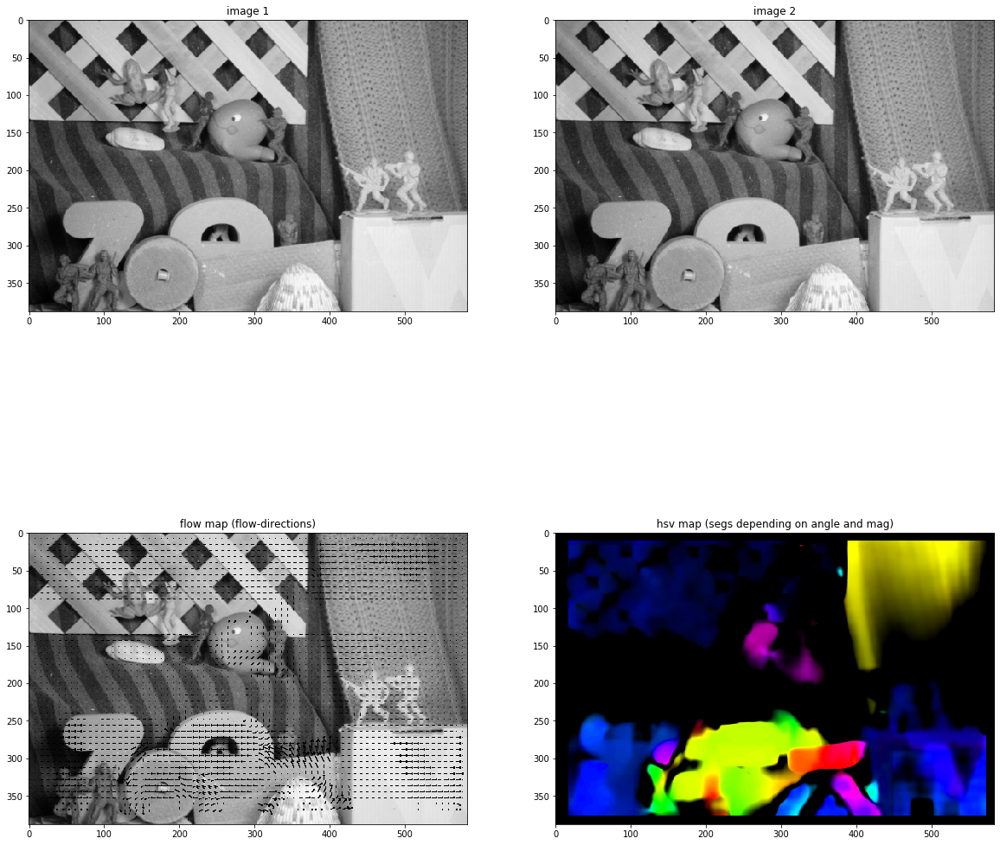

In [122]:
fdir = 'Army'
plot_results(root+fdir+'/frame10.png', root+fdir+'/frame11.png')

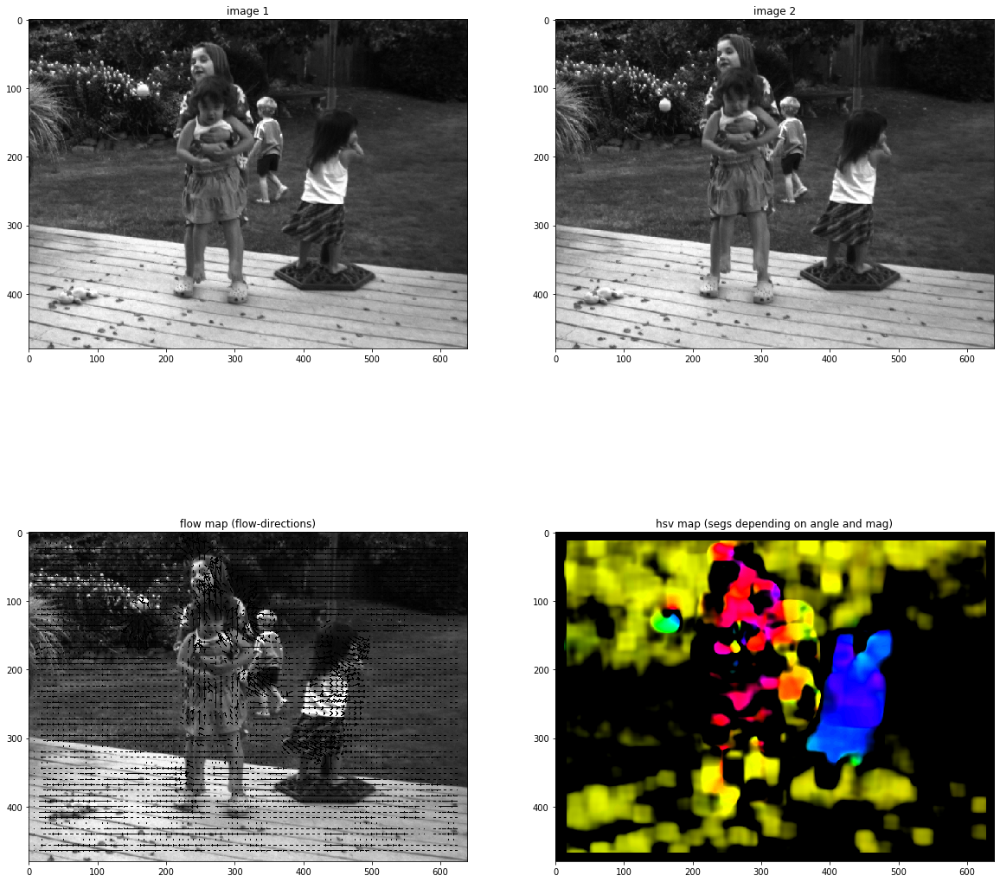

In [123]:
fdir = 'Backyard'
plot_results(root+fdir+'/frame10.png', root+fdir+'/frame11.png')

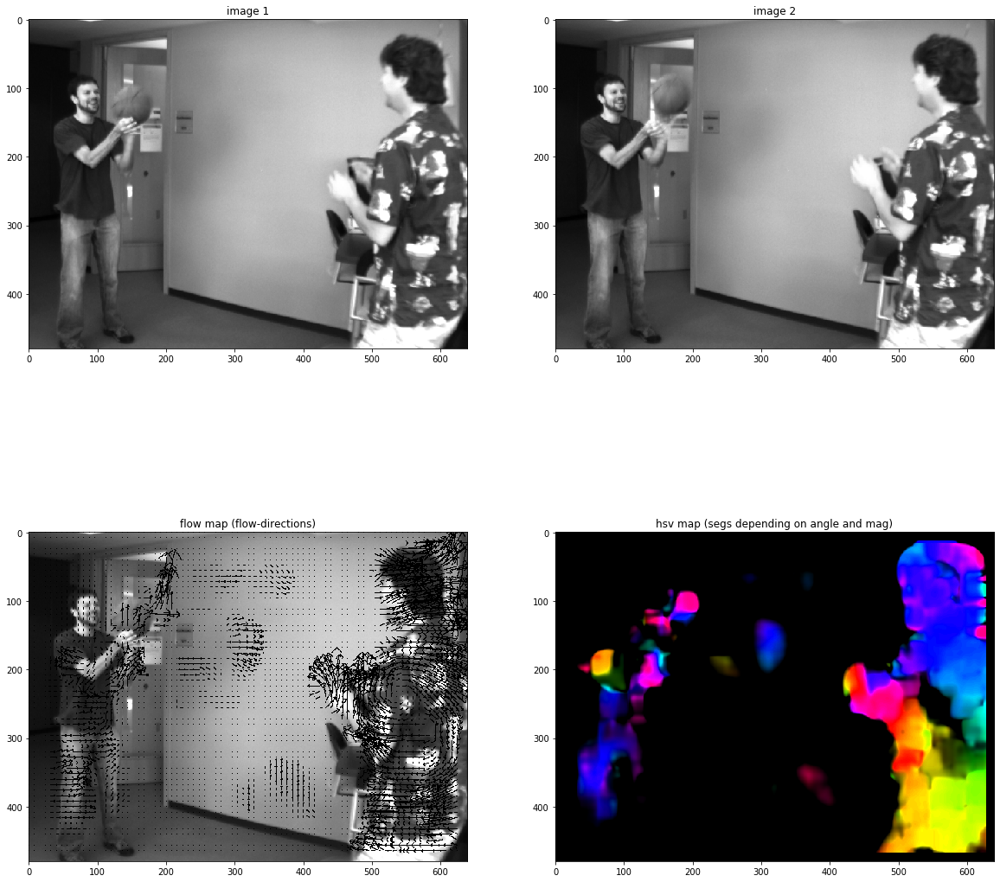

In [124]:
fdir = 'Basketball'
plot_results(root+fdir+'/frame10.png', root+fdir+'/frame11.png')

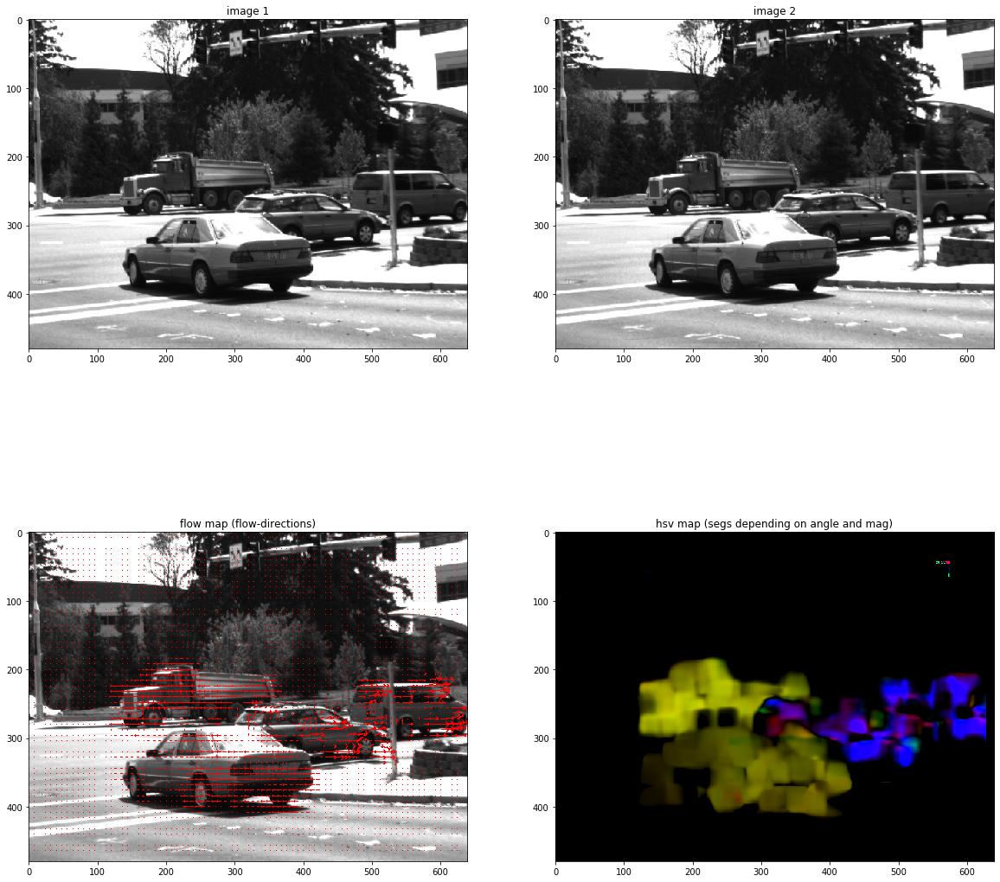

In [32]:
fdir = 'Dumptruck'
plot_results(root+fdir+'/frame10.png', root+fdir+'/frame11.png')

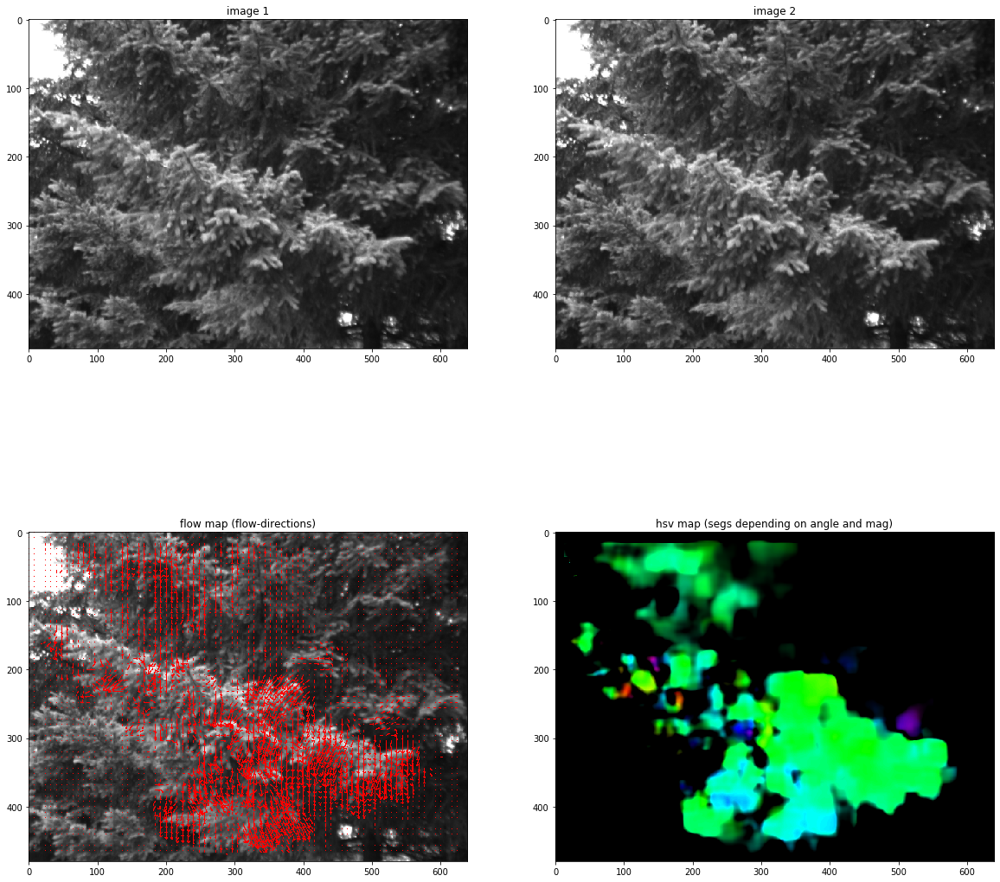

In [33]:
fdir = 'Evergreen'
plot_results(root+fdir+'/frame10.png', root+fdir+'/frame11.png')

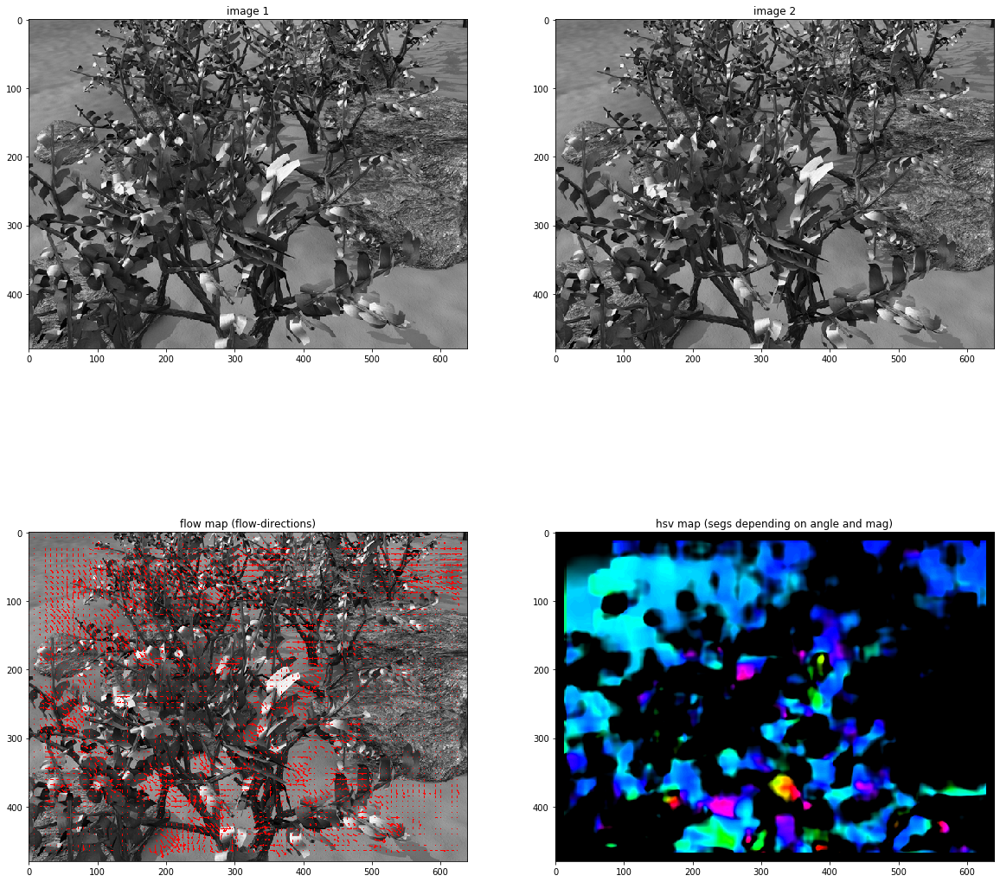

In [34]:
fdir = 'Grove'
plot_results(root+fdir+'/frame10.png', root+fdir+'/frame11.png')

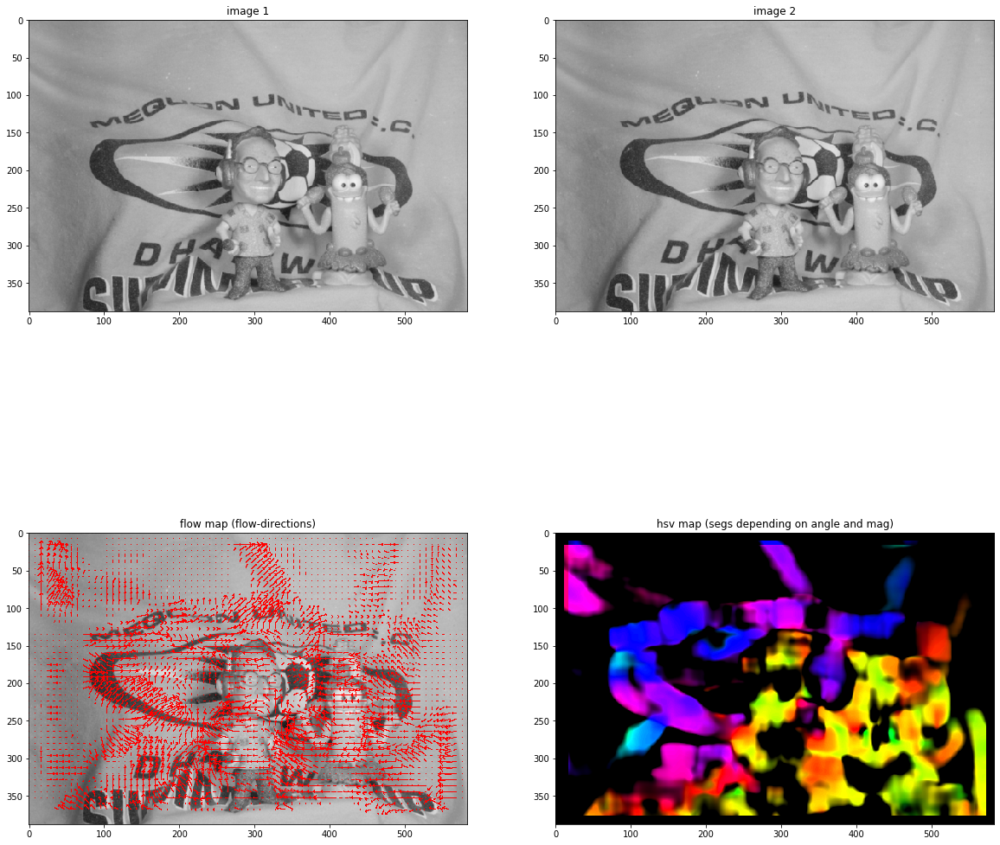

In [35]:
fdir = 'Mequon'
plot_results(root+fdir+'/frame10.png', root+fdir+'/frame11.png')

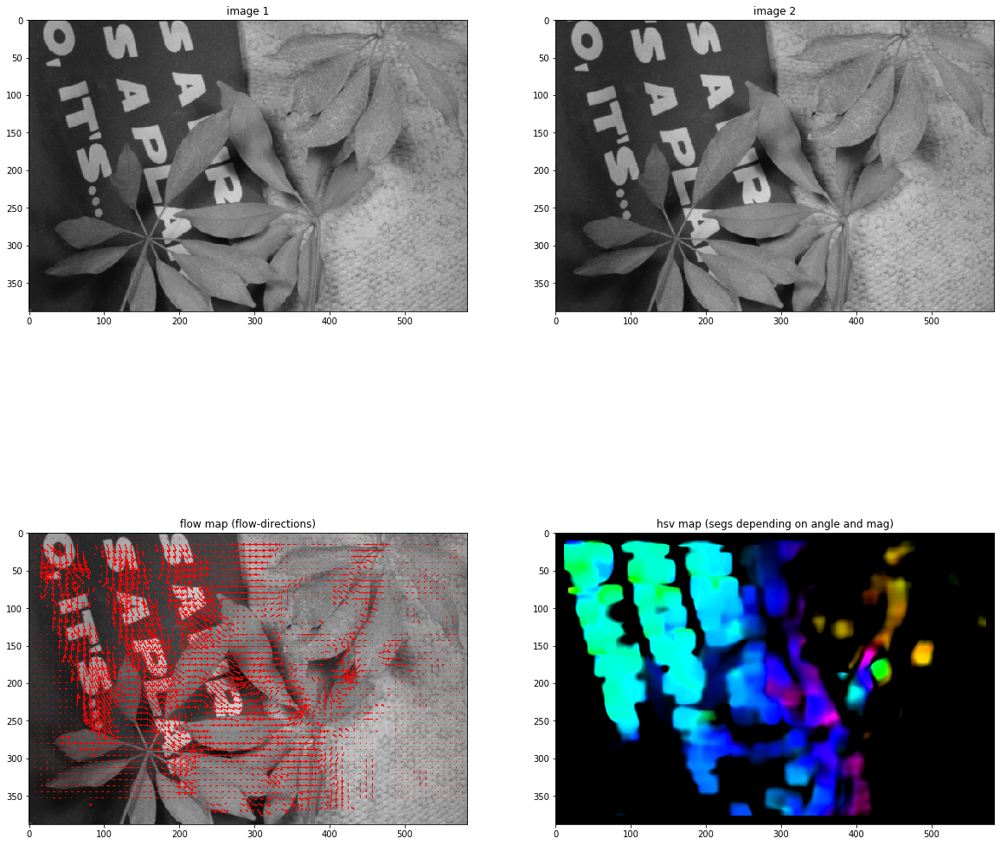

In [36]:
fdir = 'Schefflera'
plot_results(root+fdir+'/frame10.png', root+fdir+'/frame11.png')

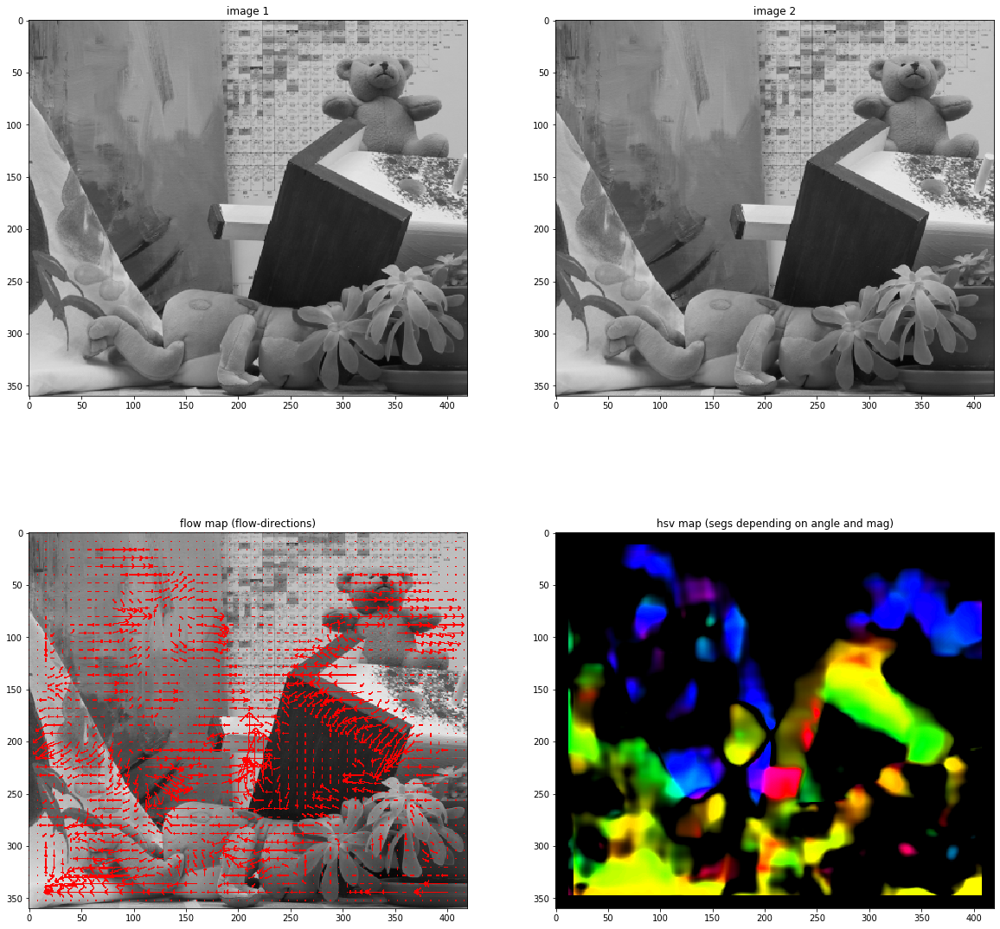

In [37]:
fdir = 'Teddy'
plot_results(root+fdir+'/frame10.png', root+fdir+'/frame11.png')

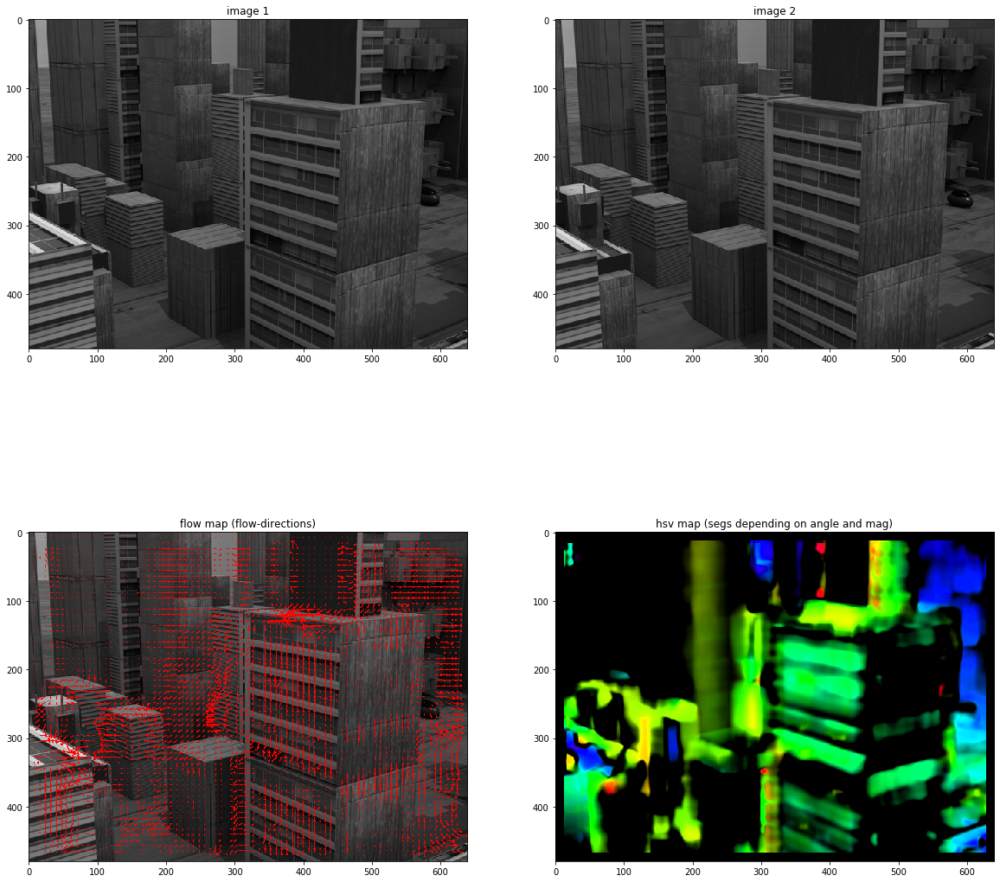

In [38]:
fdir = 'Urban'
plot_results(root+fdir+'/frame10.png', root+fdir+'/frame11.png')

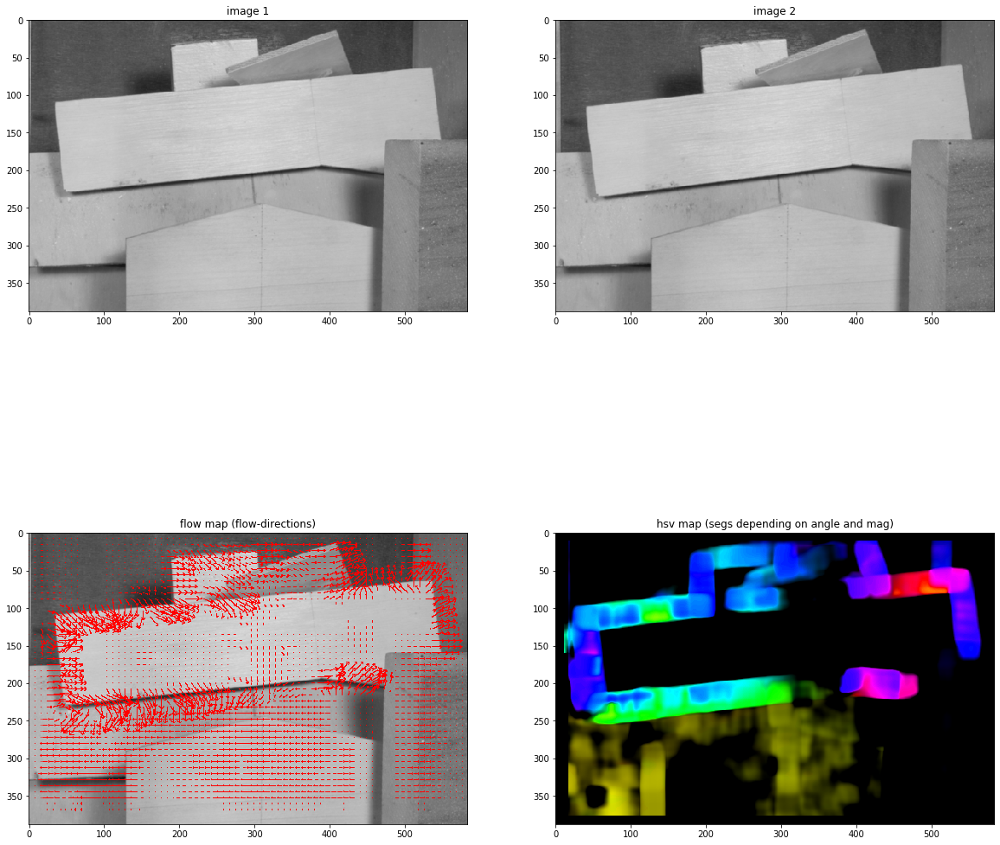

In [39]:
fdir = 'Wooden'
plot_results(root+fdir+'/frame10.png', root+fdir+'/frame11.png')

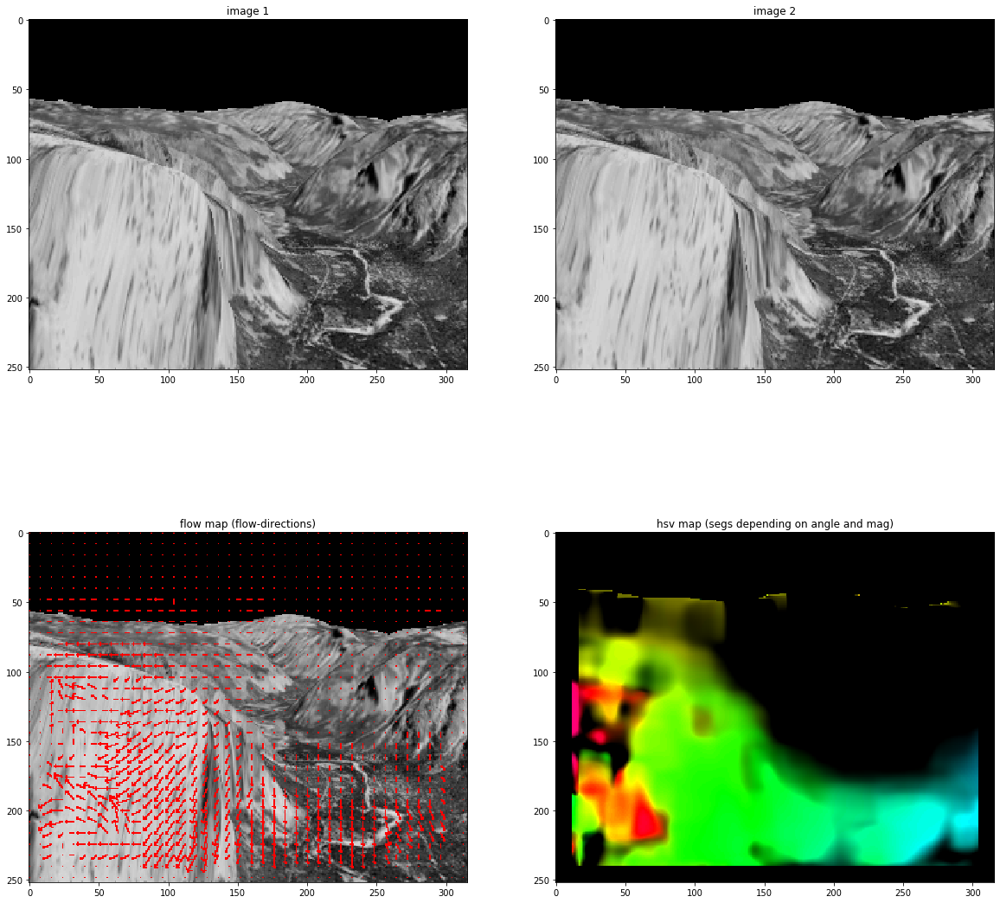

In [18]:
fdir = 'Yosemite'
plot_results(root+fdir+'/frame10.png', root+fdir+'/frame11.png')

## Result on a video (bboxes, segmentations etc.)
- Three videos outputted with:
    - bboxes
    - segmentations
    - flow directions
    
- We calculate optical flow for consecutive frames and then segment into objects by clustering them according to the optical flow
    

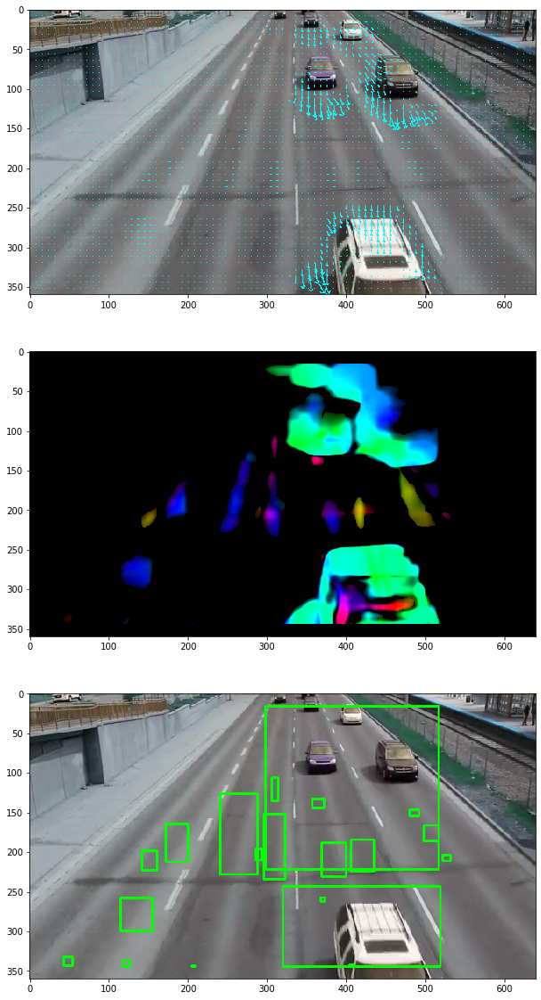

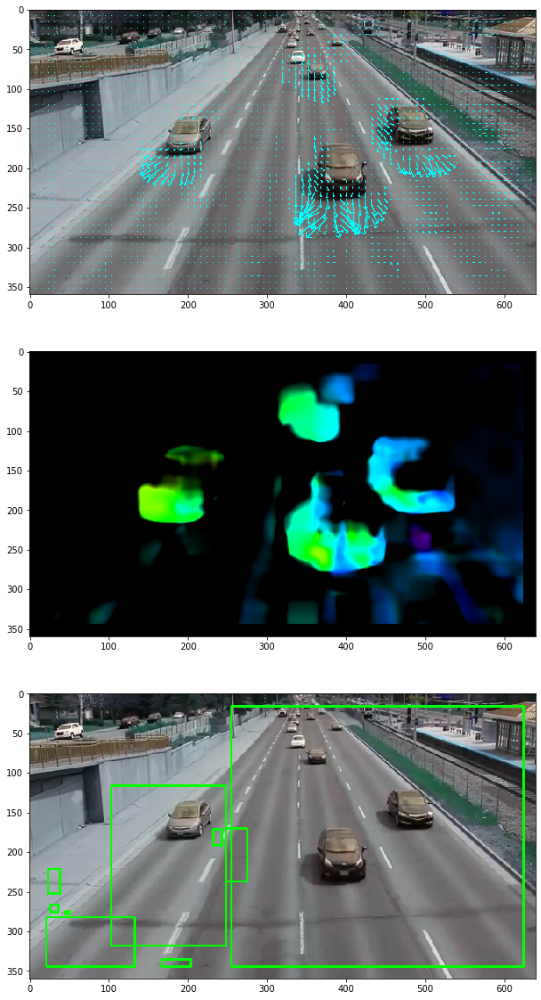

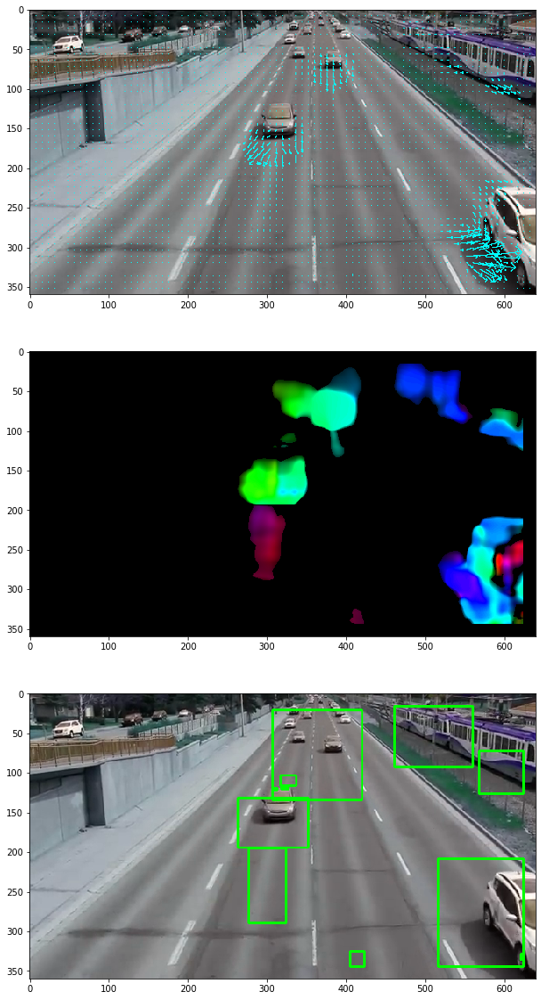

out made
hout made
bout made
processes 301 frames


In [130]:
optflow_vid('sample1.mp4','flow.mp4', gran=8, magnify=2, win=15)

With a smaller window size = 7, we observe that smaller motions are also detected.

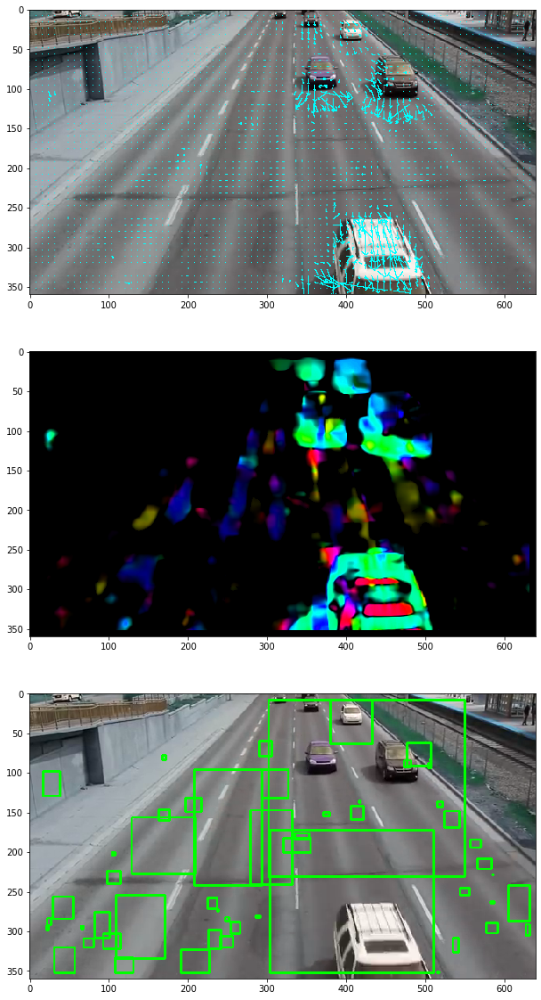

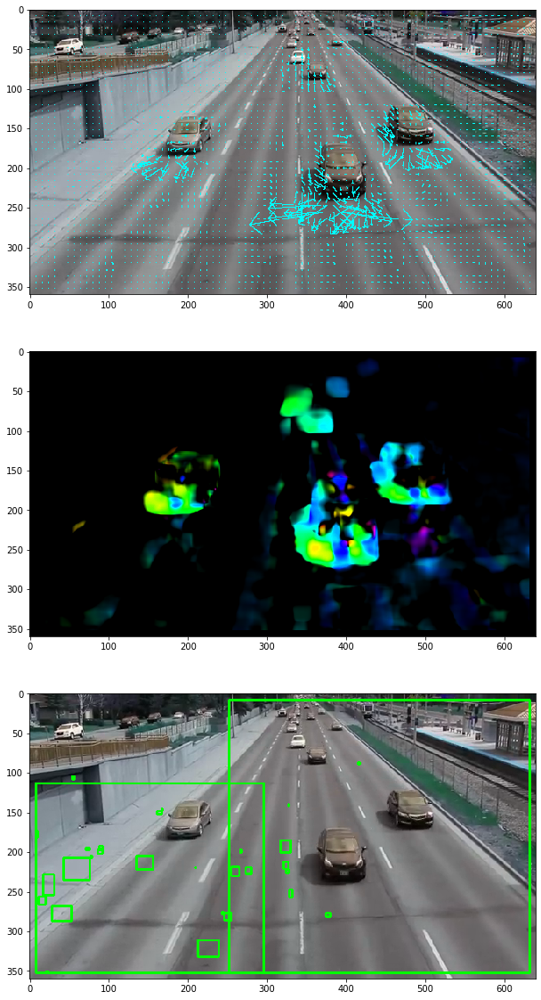

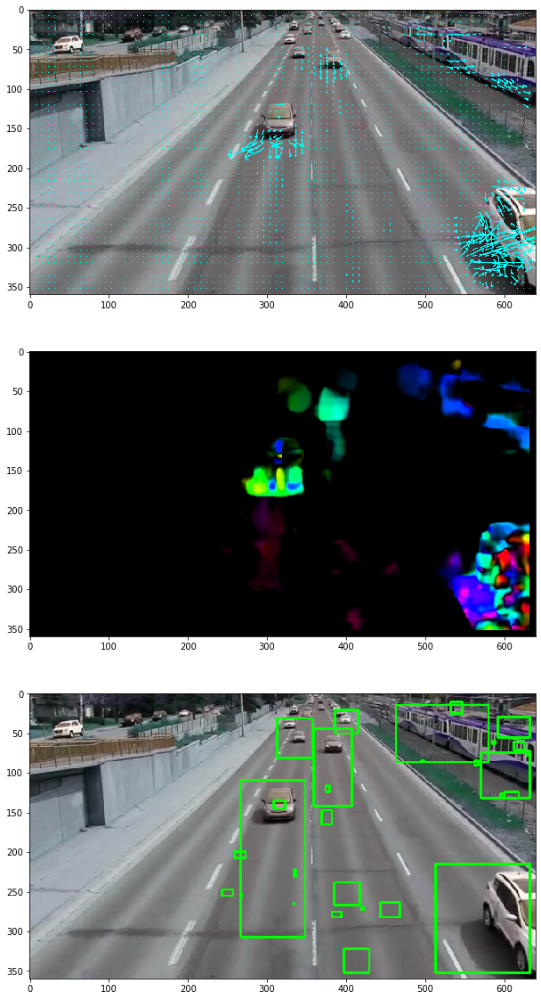

out made
hout made
bout made
processes 301 frames


In [129]:
optflow_vid('sample1.mp4','flow_71.mp4', gran=8, magnify=2, win=7)

For window size = 13

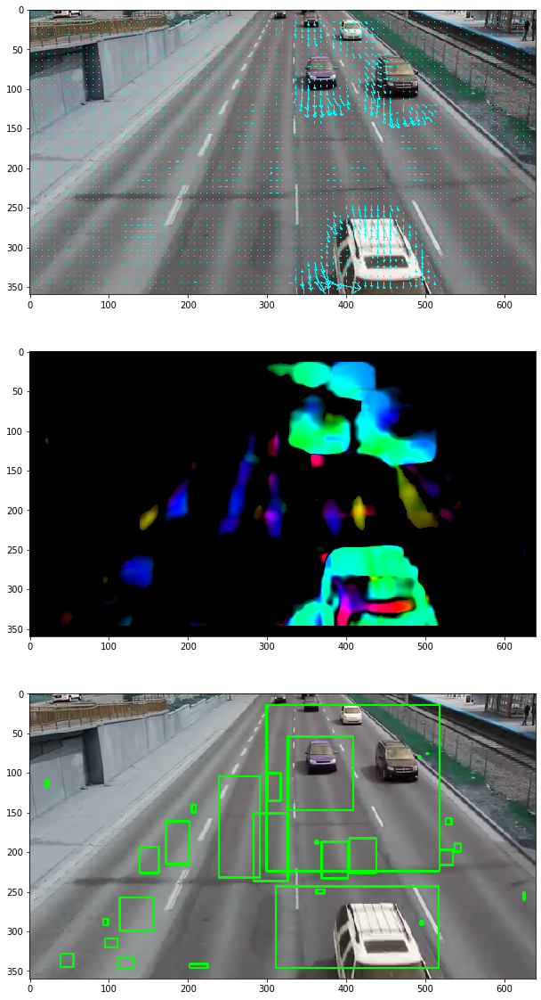

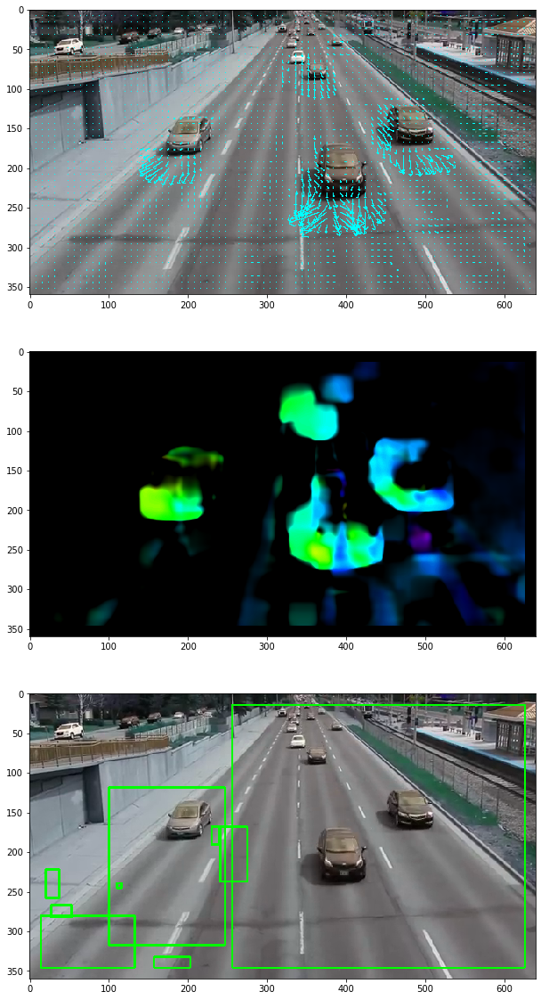

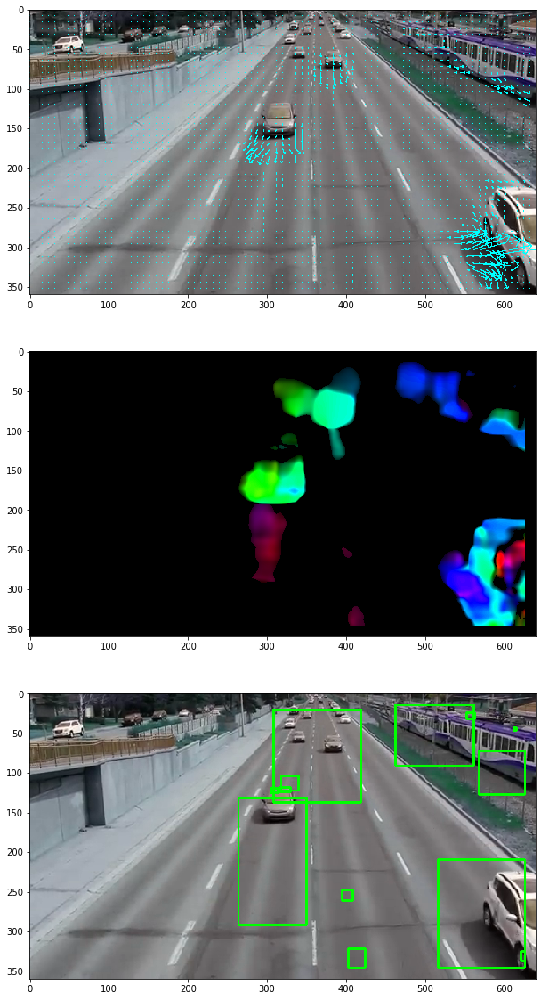

out made
hout made
bout made
processes 301 frames


In [134]:
optflow_vid('sample1.mp4','flow13.mp4',mode='dir' ,gran=8, magnify=2, win=13)

### Note:
- Some results may not be good because lucas kanade (basic implementation) is much prone to error. There are many parameters that need to be manually set. Too big window size can result in only large motions getting detected and too small window size can result in only subtle small motions getting detected
- For object tracking optical flow using Lucas Kanade isn't particularly the best, that's why we have YOLO, SSD etc for object detection